# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = './traffic-signs-data/train.p'
testing_file = './traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [2]:
import numpy as np
import pandas as pd

# TODO: Number of training examples
n_train = len(X_train)

# TODO: Number of testing examples.
n_test = len(X_test)

# TODO: What's the shape of an traffic sign image?
image_shape = X_train[0].shape

# TODO: How many unique classes/labels there are in the dataset.
n_classes = len(np.unique(y_test))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

1st example from each class


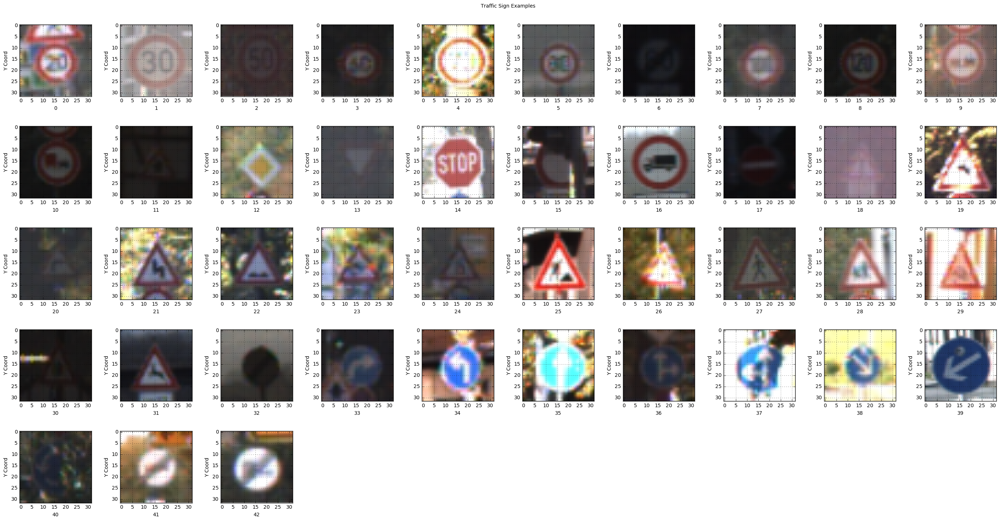

31st example from each class


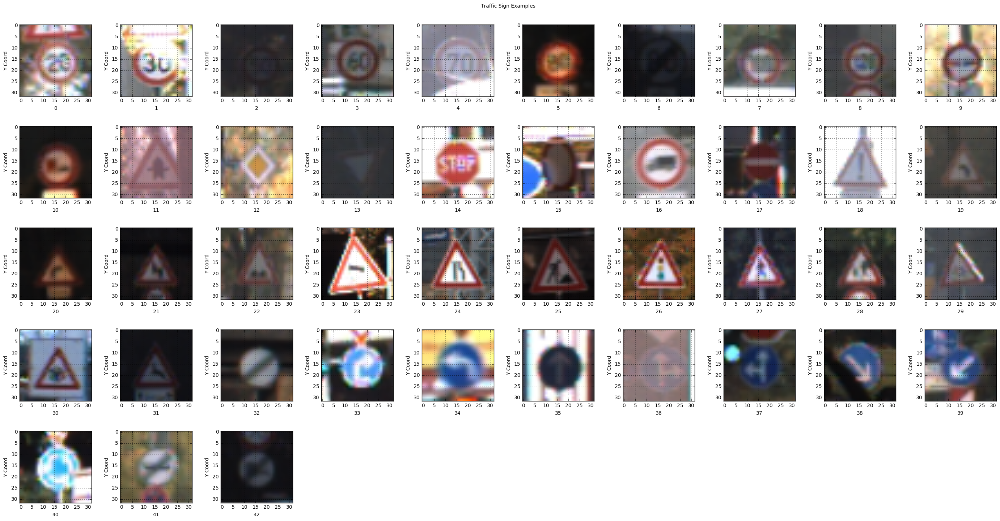

In [3]:
### Data exploration/visualization # 1
'''
This section of code plots the 1st and 31st
example from each class.
'''
import matplotlib.pyplot as plt

def plotClasses(X_train,y_train,num):
    for i in range(n_classes):
        p = True
        for j in range(len(y_train)):
            if y_train[j] == i and p == True:
                #print(i)
                p = False
                plt.subplot(5,10,i+1)
                plt.imshow(X_train[j+num,:,:,:])       

    for i in range (1,n_classes+1):
        plt.subplot(5,10,i)
        j = i - 1
        plt.xlabel(j)
        plt.ylabel('Y Coord')
        plt.grid(True)

    plt.suptitle('Traffic Sign Examples')
    plt.subplots_adjust(left=0.05,bottom=0.05,right=0.95,top=0.95,wspace=0.40,hspace=0.25)
    fig = plt.gcf()
    fig.set_size_inches(30, 15)
    #fig.savefig('TrafficSigns.png', dpi=200)
    plt.show()

num = 0
print('1st example from each class')
plotClasses(X_train,y_train,num)
num = 30
print('31st example from each class')
plotClasses(X_train,y_train,num)

Training examples counts/class
[ 210 2220 2250 1410 1980 1860  420 1440 1410 1470 2010 1320 2100 2160  780
  630  420 1110 1200  210  360  330  390  510  270 1500  600  240  540  270
  450  780  240  689  420 1200  390  210 2070  300  360  240  240]
Testing examples counts/class
[ 60 720 750 450 660 630 150 450 450 480 660 420 690 720 270 210 150 360
 390  60  90  90 120 150  90 480 180  60 150  90 150 270  60 210 120 390
 120  60 690  90  90  60  90]


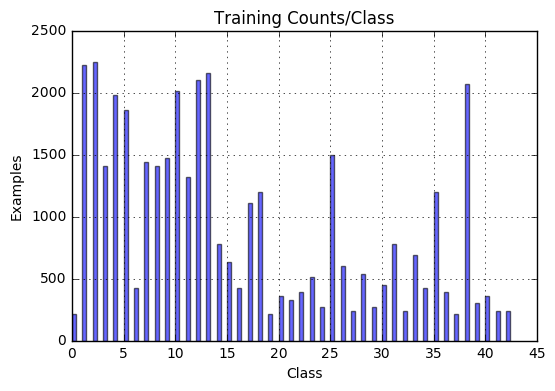

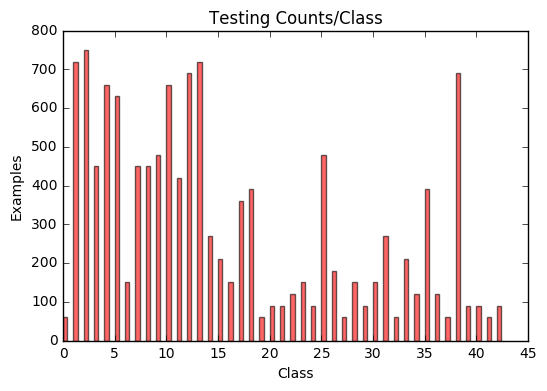

In [4]:
### Data exploration/visualization # 2
'''
Determines the number of examples from each class
for the training and testing data and plots the results
'''

def count_examples(y_train,y_test):
    counts_train = np.bincount(y_train)
    print('Training examples counts/class')
    print(counts_train)
    print('Testing examples counts/class')
    counts_test = np.bincount(y_test)
    print(counts_test)
    
    classes = np.unique(y_train)
    bar_width = 0.4
    opacity = 0.6
    
    plt.bar(classes, counts_train, bar_width, alpha=opacity,color='b')
    plt.title('Training Counts/Class')
    plt.xlabel('Class')
    plt.ylabel('Examples')
    plt.grid(True)
    plt.show()

    plt.bar(classes, counts_test, bar_width, alpha=opacity,color='r')
    plt.title('Testing Counts/Class')
    plt.xlabel('Class')
    plt.ylabel('Examples')
    plt.show()

count_examples(y_train,y_test)

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

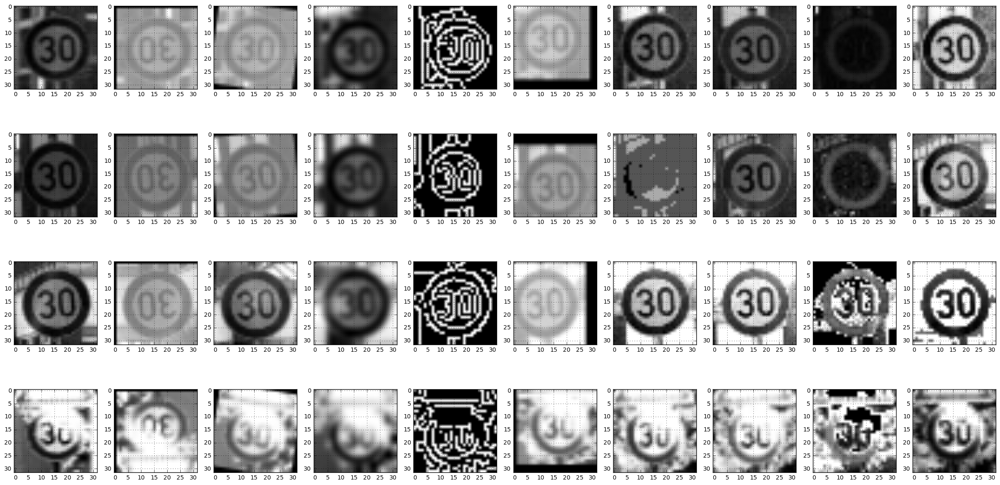

In [4]:
### Implement and Visualize Lots of Image Augmentations
import random
import cv2
from scipy import ndimage
from scipy import misc
'''
Goals for data augmentation:
1. Test the following techniques:
    - Image rotation
    - Image flips
    - Image shifts
    - RGB to gray scale
    - RGB to HLS and Isolate the H and S channels
    - Canny edge transformation
    - Blur the images using gaussian filter
    - Equalize histogram
2. Visualize the augmentations
'''

def image_flip(img):
    # Flip Image
    rotate = 180
    M = cv2.getRotationMatrix2D((img.shape[1]/2, img.shape[0]/2), rotate, 1)
    img = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))
    return img

def image_rotate(img):                        
    # Rotate Image   
    rotate = random.uniform(-15, 15)
    M = cv2.getRotationMatrix2D((img.shape[1]/2, img.shape[0]/2), rotate, 1)
    img = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))
    return img

def image_shift(img):                        
    # Shift Image  
    shift_x = random.uniform(-6, 6)
    shift_y = random.uniform(-6, 6)
    M = np.float32([[1,0,shift_x],[0,1,shift_y]])
    img = cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))
    return img

def image_gray(img):
    # Grayscale Image
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    
def image_canny(img, low_threshold, high_threshold):
    # Canny Image
    return cv2.Canny(img, low_threshold, high_threshold)

def image_blur(img, kernel_size):
    # Blur Image
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def image_HLS(img):
    #HLS
    return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

def image_HSV(img):
    img = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
    brightness = np.random.uniform(0,0.3)
    img[:,:,2] = img[:,:,2]*brightness
    return cv2.cvtColor(img,cv2.COLOR_HSV2RGB)

def image_hist(img):
    # Euqalize Histogram
    return cv2.equalizeHist(img)
    
# Main
X_new_gray = np.zeros((1000,32,32))
k = 0
for i in range(210,250):   
    if k == 0:
        #print('k=0')
        X_new_gray[i,:,:] = image_gray(X_train[i,:,:,:])
        plt.subplot(4,10,i-209)  
        plt.imshow(X_new_gray[i,:,:],cmap='gray') 
        
    if k == 1:
        #print('k=1')
        X_new_gray[i,:,:] = image_gray(X_train[i,:,:,:])
        X_new_gray[i,:,:] = image_flip(X_new_gray[i,:,:])
        plt.subplot(4,10,i-209)  
        plt.imshow(X_new_gray[i,:,:],cmap='gray') 
        
    if k == 2:
        #print('k=2')
        X_new_gray[i,:,:] = image_gray(X_train[i,:,:,:])
        X_new_gray[i,:,:] = image_rotate(X_new_gray[i,:,:])
        plt.subplot(4,10,i-209)  
        plt.imshow(X_new_gray[i,:,:],cmap='gray') 
        
        
    if k == 3:
        #print('k=3')
        X_new_gray[i,:,:] = image_gray(X_train[i,:,:,:])
        X_new_gray[i,:,:] = image_blur(X_new_gray[i,:,:],5)
        plt.subplot(4,10,i-209)
        plt.imshow(X_new_gray[i,:,:],cmap='gray')
        
    if k == 4:
        #print('k=4')
        X_new_gray[i,:,:] = image_gray(X_train[i,:,:,:])
        X_new_gray[i,:,:] = image_canny(X_new_gray[i,:,:].astype('uint8'),50,150)
        plt.subplot(4,10,i-209)
        plt.imshow(X_new_gray[i,:,:],cmap='gray')
        
    if k == 5:
        #print('k=5')
        X_new_gray[i,:,:] = image_gray(X_train[i,:,:,:])
        X_new_gray[i,:,:] = image_shift(X_new_gray[i,:,:])
        plt.subplot(4,10,i-209)
        plt.imshow(X_new_gray[i,:,:],cmap='gray')
        
    if k == 6:
        #print('k=6')
        X_HSV = image_HSV(X_train[i,:,:,:])
        X_new_gray[i,:,:] = image_gray(X_HSV)
        plt.subplot(4,10,i-209)
        plt.imshow(X_new_gray[i,:,:],cmap='gray')
    
    if k == 7:
        #print('k=7')
        X_HLS = image_HLS(X_train[i,:,:,:])
        X_new_gray[i,:,:] = X_HLS[:,:,1]
        plt.subplot(4,10,i-209)
        plt.imshow(X_new_gray[i,:,:],cmap='gray')    
    
    if k == 8:
        #print('k=8')
        X_HLS = image_HLS(X_train[i,:,:,:])
        X_new_gray[i,:,:] = X_HLS[:,:,2]
        thresh = (100, 255)
        binary = np.zeros_like(X_new_gray)
        binary[(X_new_gray > thresh[0]) & (X_new_gray <= thresh[1])] = 1
        plt.subplot(4,10,i-209)
        plt.imshow(X_new_gray[i,:,:],cmap='gray')
    
    if k == 9:
        #print('k=9')
        X_new_gray[i,:,:] = image_gray(X_train[i,:,:,:])
        X_new_gray[i,:,:] = image_hist(X_new_gray[i,:,:].astype('uint8'))
        plt.subplot(4,10,i-209)
        plt.imshow(X_new_gray[i,:,:],cmap='gray')
        
        
    for j in range(1,41):
        plt.subplot(4,10,j)
        plt.grid(True)
        
    #new_counts += 1
    #total_count[i] += new_counts
    k += 1  
    if k == 10:
        k = 0

fig = plt.gcf()
fig.set_size_inches(30, 15)
plt.show()

### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

#### Training Data Image Augmentation
I experimented with and visualized many different types of image augmentation including grayscale, rotations, shifts, vertical flipping, RGB to HSV, RGB to HLS, Canny Edge and equalize histogram. I then selected several of these image augmentation techniques to create more training data. The goal was to provide training data that varied enough that the model would generalize itself to the augmentations. I exclusively used grayscale images as opposed to RGB images for two reasons: 1. It allowed the model to train faster and use less memory and 2. In the P. Sermanet/Y. Lecun paper, they provide a plot (Figure 3 in paper) that shows the results of using many different sized models with color versus grayscale images. They show the surprising result that a model with grayscale images actually performs the best of any model. They hypothesize that the poor lighting in many of the images makes using color unreliable. 

#### Image Normalization
Image normalization is used on the input image pixel values because you want the model's values to have as close to zero mean and equal variance as possible. This helps the optimizer to reach a solution quickly. I used the formula (X-128)/128 on the training, validation and testing images to normalize the pixel values between -1 and 1.

#### Validation and Test Image Preprocessing
The validation and testing images were grayscaled and normalized the same as the training images. Grayscale is required so that the images have consistent shape to the training images and normalization is required because the model weights have been trained with the normalized image pixel values. 

#### Shuffling
It is extremely important to shuffle the training data before passing it to the model. The validation and test data are not shuffled and are passed to the model in sequence.

####  One-hot Encoding
The training, validation and testing labels were all one-hot encoded. This is done so that the model's predictions can easily be compared to the true label where the correct class is represented as a 1 and all other classes represented with 0's.

/home/carnd/anaconda3/envs/CarND-Traffic-Sign-Classifier-Project/lib/python3.5/site-packages/ipykernel/__main__.py:42: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/carnd/anaconda3/envs/CarND-Traffic-Sign-Classifier-Project/lib/python3.5/site-packages/ipykernel/__main__.py:43: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


[0, 180, 2370, 4590, 5970, 7920, 9750, 10140, 11550, 12930, 14370, 16350, 17640, 19710, 21840, 22590, 23190, 23580, 24660, 25830, 26010, 26340, 26640, 27000, 27480, 27720, 29190, 29760, 29970, 30480, 30720, 31140, 31890, 32100, 32759, 33149, 34319, 34679, 34859, 36899, 37169, 37499, 37709]
265433


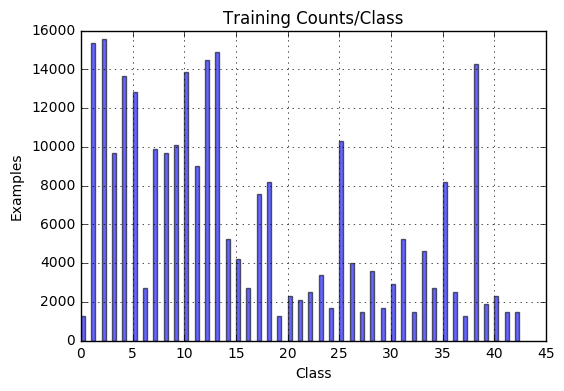

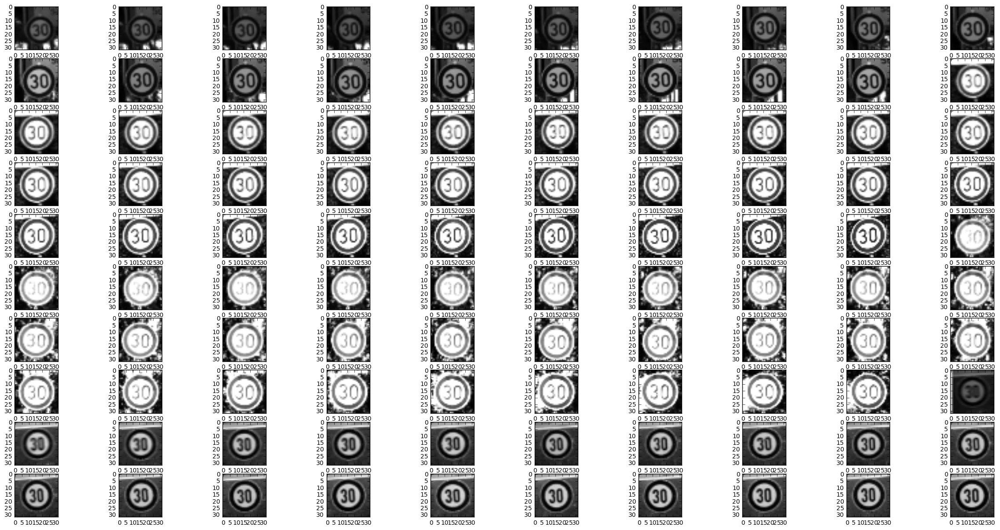

(1290, 32, 32, 3)
(12630, 32, 32, 3)


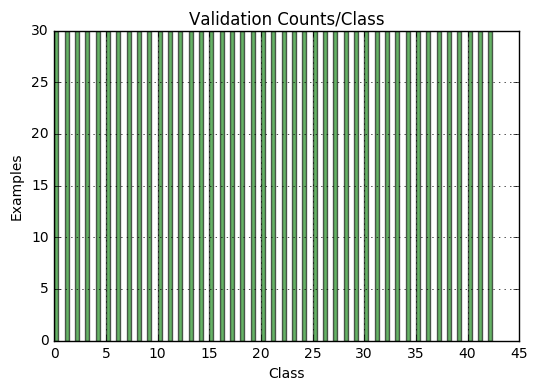

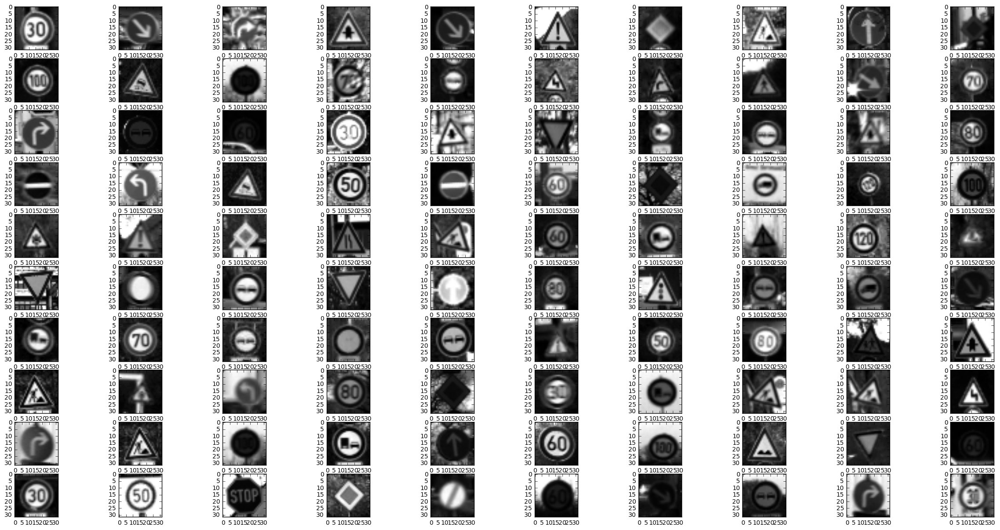

In [5]:
### Generate additional data (OPTIONAL!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

'''
The following code splits the train/val data
and then creates 7X the training for each class 
using various image augmentation techniques. It also
converts the val/test images to gray scale.
'''
import random
import cv2
from scipy import ndimage
from scipy import misc

# Main
# ----------------------------------------------
counts_train = np.bincount(y_train)
total_count = np.bincount(y_train)
classes = np.unique(y_train)

# Breakout the validation data from each class
# ----------------------------------------------
X_val = np.zeros((1290,32,32,3))
y_val = np.zeros((1290))
X_train_n = X_train
y_train_n = y_train
classbreak = [0]  # Store indices of classbreaks
del_val = []

# Determine the start/end indexes for classes
# ----------------------------------------------
for i in range(1,y_train.shape[0]):
    if y_train[i] != y_train[i-1]:
        classbreak.append(i)

start = 0
end = 30
for c in range(len(classes)):
    n_tracks = np.ceil(counts_train[c]/30)
    rand_track = random.uniform(0,n_tracks-1)
    X_val[start:end,:,:,:] = X_train[(classbreak[c]+rand_track*30):(classbreak[c]+rand_track*30+30),:,:,:]
    y_val[start:end] = y_train[(classbreak[c]+rand_track*30):(classbreak[c]+rand_track*30+30)]
    del_1 = int(classbreak[c]+rand_track*30)
    del_2 = int(classbreak[c]+rand_track*30+30)
    del_val.append(range(del_1,del_2))
    start += 30
    end += 30

X_train_n = np.delete(X_train,del_val,0)
y_train_n = np.delete(y_train,del_val,0)
counts_train = np.bincount(y_train_n)

# Determine the start/end indexes for new training data
# ----------------------------------------------
classbreak = [0]
for i in range(1,y_train_n.shape[0]):
    if y_train_n[i] != y_train_n[i-1]:
        classbreak.append(i)

print(classbreak)

# Create 7X the training examples per class
# ----------------------------------------------
#goal_per_class = 4000
#examples = goal_per_class*len(classes)
examples = len(X_train_n)*7
print(examples)
X_train_gray = np.zeros((examples,32,32))
y_train_gray = np.zeros((examples))

k = 0
j = 0
ynum = 0
for c in range(len(classes)):
    if c > 0:
        j = classbreak[c]

    for i in range(counts_train[c]*7):  #counts_train[c]*5

        if i < counts_train[c]:
            X_train_gray[ynum,:,:] = image_gray(X_train_n[j,:,:,:])
            y_train_gray[ynum] = c
            ynum += 1
            j += 1
        else:
            if c == 42:
                if j > classbreak[c]+counts_train[c]-1:
                    j = classbreak[c]
            
            X_train_gray[ynum,:,:] = image_gray(X_train_n[j,:,:,:])
            if k < 5:
                X_train_gray[ynum,:,:] = image_rotate(X_train_gray[ynum,:,:])
                X_train_gray[ynum,:,:] = image_shift(X_train_gray[ynum,:,:])
            
            if k == 5:
                X_train_gray[ynum,:,:] = image_flip(X_train_gray[ynum,:,:])

            if k == 6:
                X_train_gray[ynum,:,:] = image_blur(X_train_gray[ynum,:,:],5)

            if k == 7:
                X_HSV = image_HSV(X_train_n[j,:,:,:])
                X_train_gray[ynum,:,:] = image_gray(X_HSV)
            
            if k == 8:
                X_HLS = image_HLS(X_train_n[j,:,:,:])
                X_train_gray[ynum,:,:] = X_HLS[:,:,1]
                
            if k == 9 or k == 10:
                X_train_gray[ynum,:,:] = image_hist(X_train_gray[ynum,:,:].astype('uint8'))

            y_train_gray[ynum] = c
            ynum += 1
            j += 1
            
            k += 1
            if k == 11:
                k = 0
            
            if j > classbreak[c] + counts_train[c]:
                j = classbreak[c]

# Plot the resulting images 
# ----------------------------------------------
classes = np.unique(y_train_gray)
counts_train_gray = np.bincount(y_train_gray.astype(int))
bar_width = 0.4
opacity = 0.6

plt.bar(classes, counts_train_gray, bar_width, alpha=opacity,color='b')
plt.title('Training Counts/Class')
plt.xlabel('Class')
plt.ylabel('Examples')
plt.grid(True)
plt.show()
   
for j in range(1,101):
    plt.subplot(10,10,j)
    plt.imshow(X_train_gray[j+1420,:,:],cmap='gray')

fig = plt.gcf()
fig.set_size_inches(30, 15)
plt.show()

# Gray the validation and test data
# ----------------------------------------------
print(X_val.shape)
print(X_test.shape)

X_val_gray = np.zeros((X_val.shape[0],X_val.shape[1],X_val.shape[2]))
for i in range(len(X_val)):
    X_val_gray[i,:,:] = image_gray(X_val[i,:,:,:].astype('uint8'))
    
X_test_gray = np.zeros((X_test.shape[0],X_test.shape[1],X_test.shape[2]))
for i in range(len(X_test)):   
    X_test_gray[i,:,:] = image_gray(X_test[i,:,:,:])
    
counts_val_gray = np.bincount(y_val.astype(int))
bar_width = 0.4
opacity = 0.6

plt.bar(classes, counts_val_gray, bar_width, alpha=opacity,color='g')
plt.title('Validation Counts/Class')
plt.xlabel('Class')
plt.ylabel('Examples')
plt.grid(True)
plt.show()

# Plot some testing examples
# ----------------------------------------------
for j in range(1,101):
    plt.subplot(10,10,j)
    plt.imshow(X_test_gray[j,:,:],cmap='gray')

fig = plt.gcf()
fig.set_size_inches(30, 15)
plt.show()

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

#### Training Data
I generated and saved to memory 7X the number of training examples per class. If the images were larger in size, a data generator would have been necessary, but since the images were only 32x32x1 (as grayscale) I could get away with not using a generator. The purpose with creating 7X the training data was to help prevent overfitting to the actual images. I wanted to create a more generalized model and image augmentations proved very successful in impoving the accuracy on the test set.

#### Train/Val Split
Once the image augmentation techniques were working, I split the training and validation data according to tracks and classes. In P. Sermanet and Y. LeCun's paper they describe that the images are taken from video and so each consecutive 30 images are a 'track' of the same sign. Validation sets should be selected as 'tracks'. So the validation set is 1290 images (tracks of 30 images * 43 classes). I found that this worked well to produce validation loss/accuracy that was very similar to the test loss/accuracy.

#### Distribution of Class Images Training/Test
The distribution of training images/class is skewed. I originally experimented with equalizing the number of training examples from each class, but found that it was better to keep the same distribution since the test set also followed a similar skewed distribution. This created an inherent bias within the model that was beneficial. Without the skewed class distribution I saw the accuracy drop from validation to test.

EPOCH: 1, STEP: 0, LOSS: 3.760, ACC: 0.094
EPOCH: 1, STEP: 500, LOSS: 3.424, ACC: 0.062
EPOCH: 1, STEP: 1000, LOSS: 3.121, ACC: 0.109
EPOCH: 1, STEP: 1500, LOSS: 2.307, ACC: 0.391
EPOCH: 1, STEP: 2000, LOSS: 2.237, ACC: 0.344
EPOCH: 1, STEP: 2500, LOSS: 2.074, ACC: 0.406
EPOCH: 1, STEP: 3000, LOSS: 1.661, ACC: 0.516
EPOCH: 1, STEP: 3500, LOSS: 1.919, ACC: 0.547
EPOCH: 1, STEP: 4000, LOSS: 1.432, ACC: 0.562
EPOCH: 1, STEP: 4146, TRAIN LOSS: 1.432, TRAIN ACC: 0.562
EPOCH: 1, STEP: 4146, VAL LOSS: 1.283, VAL ACC: 0.598
EPOCH: 2, STEP: 8293, TRAIN LOSS: 0.866, TRAIN ACC: 0.797
EPOCH: 2, STEP: 8293, VAL LOSS: 0.550, VAL ACC: 0.798
Model Saved.

EPOCH: 3, STEP: 12440, TRAIN LOSS: 0.544, TRAIN ACC: 0.859
EPOCH: 3, STEP: 12440, VAL LOSS: 0.316, VAL ACC: 0.905
Model Saved.

EPOCH: 4, STEP: 16587, TRAIN LOSS: 0.357, TRAIN ACC: 0.906
EPOCH: 4, STEP: 16587, VAL LOSS: 0.186, VAL ACC: 0.943
Model Saved.

EPOCH: 5, STEP: 20734, TRAIN LOSS: 0.208, TRAIN ACC: 0.969
EPOCH: 5, STEP: 20734, VAL LOSS: 0.14

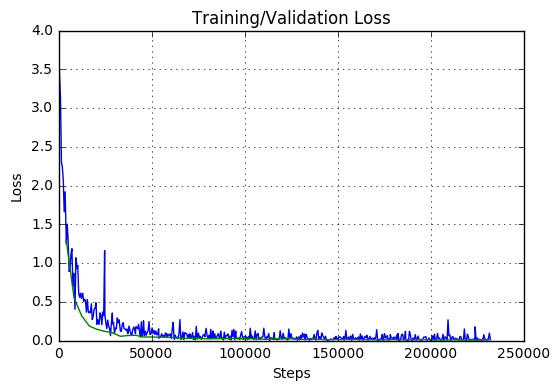

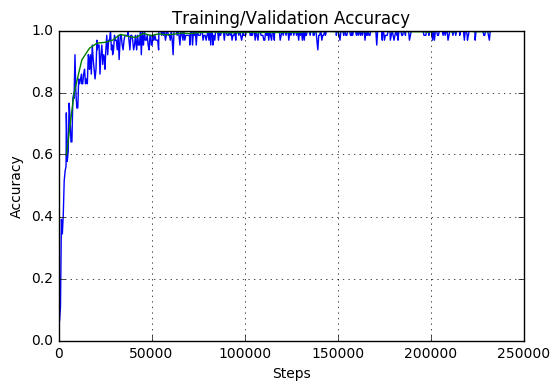

12630
(12630, 43)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42
0,59,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,719,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,8,734,6,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,438,0,10,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,8,3,2,640,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,1,0,0,0,0
5,0,0,1,1,1,626,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,11,0,2,136,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
7,0,0,0,1,0,3,0,418,28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,2,0,0,7,0,0,0,0,440,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,478,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [6]:
### Define your architecture here.
### Feel free to use as many code cells as needed.
"""
Traffic Sign Architecture

The following code perform several steps:
1. Builds the model
2. Reads in the train/val/test data
3. Normalized the images using (X-128)/128
4. Converts labels to one-hot
5. Trains the model while showing loss/accuracy
6. Evaluates the model on the validation set after each Epoch
7. Evaluates the model on the test set after final Epoch
8. Saves the model
9. Shows images of loss/accuracy over all training steps
10. Prints out the confusion matrix
"""
import tensorflow as tf
import pandas as pd
from tensorflow.contrib.layers import flatten
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import confusion_matrix
from IPython.display import display, HTML

save_file = 'train_model_10.ckpt'
EPOCHS = 60
BATCH_SIZE = 64
BATCH_SIZE_TEST = 30

def weight_variable(shape):
    initial = tf.truncated_normal(shape, stddev=0.01)
    return tf.Variable(initial)

def bias_variable(shape):
    initial = tf.constant(0.01, shape=shape)
    return tf.Variable(initial)

def conv2d(x, W, stride):
    return tf.nn.conv2d(x, W, strides=[1, stride, stride, 1], padding='SAME')

def max_pool_2x2(x):
    return tf.nn.max_pool(x, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')

# LeNet architecture:
# INPUT -> CONV -> ACT -> POOL -> CONV -> ACT -> POOL -> FLATTEN -> FC -> ACT -> FC

def LeNet(x, keep_prob, keep_prob1):
    # Layer 1
    # -----------------------------------------------
    # 32X32X32
    conv1_W = weight_variable([3, 3, 1, 32])
    conv1_b = bias_variable([32])
    conv1 = tf.nn.relu(conv2d(x, conv1_W, 1) + conv1_b)

    # 16x16x32
    conv1 = max_pool_2x2(conv1)
    conv1 = tf.nn.dropout(conv1, keep_prob1)
    
    # Layer 2
    # -----------------------------------------------
    #16X16X64
    conv2_W = weight_variable([3, 3, 32, 64])
    conv2_b = bias_variable([64])
    conv2 = tf.nn.relu(conv2d(conv1, conv2_W, 1) + conv2_b)

    # 8x8x64
    conv2 = max_pool_2x2(conv2)
    conv2 = tf.nn.dropout(conv2, keep_prob)
    
    # Layer 3
    # -----------------------------------------------
    # 8X8X128
    conv3_W = weight_variable([3, 3, 64, 128])
    conv3_b = bias_variable([128])
    conv3 = tf.nn.relu(conv2d(conv2, conv3_W, 1) + conv3_b)

    # 4x4x128
    conv3 = max_pool_2x2(conv3)
    conv3 = tf.nn.dropout(conv3, keep_prob)

    # Layer 4
    # -----------------------------------------------    
    # Flatten all three conv layers and concat
    conv1_f = flatten(conv1)
    conv2_f = flatten(conv2)
    conv3_f = flatten(conv3)
    fc1 = tf.concat(1,[conv1_f,conv2_f]) #flatten(conv3)
    fc1 = tf.concat(1,[fc1,conv3_f])
    
    # Layer 5
    # ----------------------------------------------- 
    # FC1
    fc1_W = weight_variable([fc1.get_shape().as_list()[-1], 1024])
    fc1_b = tf.Variable(tf.zeros(1024))
    fc1 = tf.matmul(fc1, fc1_W) + fc1_b
    fc1 = tf.nn.relu(fc1)
    fc1 = tf.nn.dropout(fc1, keep_prob)
    
    # Layer 6
    # -----------------------------------------------
    # FC2
    fc2_W = weight_variable([1024, 1024])
    fc2_b = tf.Variable(tf.zeros(1024))
    fc2 = tf.matmul(fc1, fc2_W) + fc2_b
    fc2 = tf.nn.relu(fc2)
    fc2 = tf.nn.dropout(fc2, keep_prob)

    # Layer 7
    # ----------------------------------------------- 
    # Output layer
    fc3_W = weight_variable([1024, 43])
    fc3_b = tf.Variable(tf.zeros(43))
    return tf.matmul(fc2, fc3_W) + fc3_b


# X_train_gray consist of 32x32x1, grayscale images
x = tf.placeholder(tf.float32, (None, 32, 32, 1))
# Classify over 43 digits 0-42
y = tf.placeholder(tf.float32, (None, 43))
keep_prob = tf.placeholder(tf.float32)
keep_prob1 = tf.placeholder(tf.float32)
learning_rate = tf.placeholder(tf.float32)
fc2 = LeNet(x, keep_prob, keep_prob1)

loss_op = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(fc2, y))
opt = tf.train.AdamOptimizer(learning_rate)
train_op = opt.minimize(loss_op)
correct_prediction = tf.equal(tf.argmax(fc2, 1), tf.argmax(y, 1))
accuracy_op = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
predictions = tf.argmax(fc2, 1)

def eval_data(x_set,y_set):
    """
    Given a dataset as input returns the loss and accuracy.
    """
    steps_per_epoch = x_set.shape[0] // BATCH_SIZE
    num_examples = steps_per_epoch * BATCH_SIZE
    total_acc, total_loss = 0, 0
    sess = tf.get_default_session()
    j = 0
    for step in range(steps_per_epoch):
        batch_x = x_set[j:j+BATCH_SIZE,:,:,:]
        batch_y = y_set[j:j+BATCH_SIZE]
        j = j + BATCH_SIZE
        loss, acc = sess.run([loss_op, accuracy_op], feed_dict={x: batch_x, y: batch_y, keep_prob:1.0, keep_prob1:1.0})
        total_acc += (acc * batch_x.shape[0])
        total_loss += (loss * batch_x.shape[0])
    return total_loss/num_examples, total_acc/num_examples

def eval_data_test(x_set,y_set):
    """
    Given a dataset as input returns the loss and accuracy.
    """
    steps_per_epoch = x_set.shape[0] // BATCH_SIZE_TEST
    num_examples = steps_per_epoch * BATCH_SIZE_TEST
    total_acc, total_loss = 0, 0
    sess = tf.get_default_session()
    j = 0
    for step in range(steps_per_epoch):
        batch_x = x_set[j:j+BATCH_SIZE_TEST,:,:,:]
        batch_y = y_set[j:j+BATCH_SIZE_TEST]
        j = j + BATCH_SIZE_TEST
        loss, acc = sess.run([loss_op, accuracy_op], feed_dict={x: batch_x, y: batch_y, keep_prob:1.0, keep_prob1:1.0})
        total_acc += (acc * batch_x.shape[0])
        total_loss += (loss * batch_x.shape[0])
    return total_loss/num_examples, total_acc/num_examples

def confusion_eval(x_set,y_set):
    """
    Given a dataset as input returns the predictions.
    """
    steps_per_epoch = x_set.shape[0] // BATCH_SIZE_TEST
    num_examples = steps_per_epoch * BATCH_SIZE_TEST
    predict = np.ndarray([])
    pred_test = np.zeros((1,12630))
    sess = tf.get_default_session()
    j = 0
    for step in range(steps_per_epoch):
        batch_x = x_set[j:j+BATCH_SIZE_TEST,:,:,:]
        batch_y = y_set[j:j+BATCH_SIZE_TEST]
        predict = np.append(predict,sess.run([predictions], feed_dict={x: batch_x, y: batch_y, keep_prob:1.0, keep_prob1:1.0}))
        j = j + BATCH_SIZE_TEST
    pred_test[0,:] = predict[1:12631]
    pred_test = np.transpose(pred_test)
    return pred_test[:,0]

if __name__ == '__main__':
    # Load data
    onehot = LabelBinarizer()
    onehot.fit(y_train_gray)
    X_training = np.zeros((X_train_gray.shape[0],X_train_gray.shape[1],X_train_gray.shape[2],1))
    X_validation = np.zeros((X_val_gray.shape[0],X_val_gray.shape[1],X_val_gray.shape[2],1))
    X_testing = np.zeros((X_test_gray.shape[0],X_test_gray.shape[1],X_test_gray.shape[2],1))
    
    # Normalize the images
    X_training[:,:,:,0] = (X_train_gray-128)/128
    X_validation[:,:,:,0] = (X_val_gray-128)/128
    X_testing[:,:,:,0] = (X_test_gray-128)/128
    
    # One hot transforms for the labels
    y_training = onehot.transform(y_train_gray)
    y_validation = onehot.transform(y_val)
    y_testing = onehot.transform(y_test)
    y_training = y_training.astype(np.float32)
    y_validation = y_validation.astype(np.float32)
    y_testing = y_testing.astype(np.float32)
    
    batches = []
    steps = []
    steps_val = []
    train_loss_store = []
    train_acc_store = []
    val_loss_store = []
    val_acc_store = []
    patience = 0
    saver = tf.train.Saver()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        #sess.run(tf.initialize_all_variables())
        steps_per_epoch = (len(X_training)) // BATCH_SIZE
        num_examples = steps_per_epoch * BATCH_SIZE
        batch_x = np.zeros((BATCH_SIZE,X_training.shape[1],X_training.shape[2],X_training.shape[3]))
        batch_y = np.zeros((BATCH_SIZE,43))
    
        # Train model
        shuffle = True
        for i in range(EPOCHS):
            j = 0
            for step in range(steps_per_epoch):            
                for m in range(BATCH_SIZE):                               
                    batch_x[m,:,:,:] = X_training[j,:,:,:]
                    batch_y[m,:] = y_training[j]
                    if shuffle:
                        j = int(random.choice(range(0,len(X_training))))
                    else:
                        j += 1
                #if i <= 20:
                loss = sess.run(train_op, feed_dict={x: batch_x, y: batch_y, keep_prob: 0.5, learning_rate: 1e-4, keep_prob1: 0.75})
                #elif i > 20 and i < 30:
                #    loss = sess.run(train_op, feed_dict={x: batch_x, y: batch_y, keep_prob: 0.5, learning_rate: 1e-4, keep_prob1: 0.75})
                #else:
                #    loss = sess.run(train_op, feed_dict={x: batch_x, y: batch_y, keep_prob: 0.5, learning_rate: 5e-5, keep_prob1: 0.75})
                if step % 500 == 0:                            
                    train_loss, train_acc = eval_data(batch_x, batch_y)
                    train_loss_store.append(train_loss)
                    train_acc_store.append(train_acc)
                    steps.append(step+i*steps_per_epoch)
                    if i+1 == 1:
                        print("EPOCH: %d, STEP: %d, LOSS: %.3f, ACC: %.3f" % (i+1, i * steps_per_epoch + step, train_loss, train_acc))
                if shuffle:
                    j = int(random.choice(range(0,len(X_training)-BATCH_SIZE)))
                else:
                    j = j + BATCH_SIZE

            # Print the training loss/accuracy after each Epoch
            print("EPOCH: %d, STEP: %d, TRAIN LOSS: %.3f, TRAIN ACC: %.3f" % (i+1, i * steps_per_epoch + step, train_loss, train_acc))
            
            # Print the validation loss/accuracy after each Epoch
            val_loss, val_acc = eval_data(X_validation,y_validation)
            print("EPOCH: %d, STEP: %d, VAL LOSS: %.3f, VAL ACC: %.3f" % (i+1, i * steps_per_epoch + step, val_loss, val_acc))
            #print("EPOCH {} ...".format(i+1))
            #print("Validation loss = {:.3f}".format(val_loss))
            #print("Validation accuracy = {:.3f}".format(val_acc))
            
            # Implement Early Stopping (patience=5)
            if i+1 == 1:
                val_best = val_loss
                val_loss_store.append(val_loss)
                val_acc_store.append(val_acc)
                steps_val.append(i * steps_per_epoch + step)
            
            if i+1 > 1:                       
                if val_loss < min(val_loss_store):
                    val_best = val_loss
                    patience = 0
                    # Save the model
                    saver.save(sess, save_file)
                    print('Model Saved.')
                    print()
                    
                val_loss_store.append(val_loss)
                val_acc_store.append(val_acc)
                steps_val.append(i * steps_per_epoch + step)
            
                if val_loss > val_best:
                    patience += 1
                    print("Patience is:")
                    print(patience)
                    print()
                    if patience == 7:
                        print("Training Stopped, Best Model Saved...")
                        print()
                        break

        # Evaluate on the test data
        test_loss, test_acc = eval_data_test(X_testing,y_testing)
        print("Test loss = {:.3f}".format(test_loss))
        print("Test accuracy = {:.3f}".format(test_acc))
        
        # Plot the Training/Validation Loss for All Steps
        plt.plot(steps, train_loss_store, 'b',hold=True)
        plt.plot(steps_val, val_loss_store, 'g',hold=True)
        plt.title('Training/Validation Loss')
        plt.xlabel('Steps')
        plt.ylabel('Loss')
        plt.grid(True)
        plt.show()
        
        # Plot the Training Accuracy for All Steps
        plt.plot(steps, train_acc_store, 'b',hold=True)
        plt.plot(steps_val, val_acc_store, 'g',hold=True)
        plt.title('Training/Validation Accuracy')
        plt.xlabel('Steps')
        plt.ylabel('Accuracy')
        plt.grid(True)
        plt.show()
        
        # Print Out the Confusion Matrix
        test_predictions = confusion_eval(X_testing,y_testing)
        print(len(test_predictions))
        print(y_testing.shape)
        df_confusion = pd.DataFrame(confusion_matrix(onehot.inverse_transform(y_testing), test_predictions))
        df_confusion.columns= range(43)
        df_confusion.index= range(43)
        pd.options.display.max_columns = 45
        display(df_confusion)

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

#### Model Structure and Parameters
The following table shows the final model architecture, size per layer, memory per layer and number of parameters per layer. Note that the output from each conv layer's maxpool is given to the FC1 layer using layer skipping. So the number of parameters at the FC1 layer is ((16x16x32)+(8x8x64)+(4x4x128) x 1024).

| Layer | Size | Memory (Forward Pass) | # Parameters (Not Counting Bias) |
| ---- | :------------------:| --------:| ---------------:|
| input | 32 X 32 X 1 | 0.001 MB | 0 |
| conv1 | 32 X 32 X 32 | 0.033 MB | 288 | 
| pool1 | 16 X 16 X 32 | 0.008 MB | 0 | 
| dropout1 | keep_prob = 0.75 | -- | -- | 
| conv2 | 16 X 16 X 64 | 0.016 MB | 18432 | 
| pool2 | 8 X 8 X 64 | 0.004 MB | 0 | 
| dropout2 | keep_prob = 0.5 | -- | -- | 
| conv3 | 8 X 8 X 128 | 0.008 MB | 73728 | 
| pool3 | 4 X 4 X 128 | 0.002 MB | 0 | 
| dropout3 | keep_prob = 0.5 | -- | -- | 
| FC1 | 1 X 1 X 1024 | 0.001 MB | 14680064 | 
| dropout4 | keep_prob = 0.5 | -- | -- | 
| FC2 | 1 X 1 X 1024 | 0.001 MB | 1048576 | 
| dropout5 | keep_prob = 0.5 | -- | -- | 
| output | 1 X 1 X 43 | 0.000 MB | -- | 

Based on the notes from Stanford's CS231n, this gives 0.3 MB (~0.075MB * 4 bytes) for each image on forward pass and 0.6 MB on the backward pass.  Using a batch size of 64, the max memory usage will be 38.4 MB during the backward pass.

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**
I did a lot of experimentation with hyperparameters and the optimal settings varied depending on my model architecture. The weight and bias initialization also had a significant impact on the training. In the end, I got the best results with the Adam Optimizer using the following hyperparameters:

Max Epochs set to 60:

I implemented "Early Stopping" and "Save Best Only" techniques in order to save the best model. The "Best Model" was determined by a comparison of the previous best validation loss to the current vlidation loss. The "Early Stopping" function used a patience parameter = 7 (wait 7 Epochs more for improvement) to see if the model would beat its best validation loss. Only the best model was then saved. I set the max Epochs to 60 as I found that the "Early Stopping" would usually end the training after 40-50 Epochs. These implementations helped prevent over/under fitting of the training data. The training/validation loss and accuracy are printed once after each Epoch and can be seen above. They are also plotted once the training has completed.

Batch Size = 64 # Training Set

Batch Size  Test = 30 # Test set batch size was 30 to divide evenly into number of examples

Learning Rate =  1e-4  # I lowered this from 2e-4 after implementing "Early Stopping" and "Save Best Only" which got the model to a slightly higher test accuracy.

Weight Initialization: stddev=0.01

Bias Initialization: stddev=0.01

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**
My general approach followed a similar methodology to what was laid out in P. Sermanet and Y. Lecun's "Traffic Sign Recognition with Multi-Scale Convolutional Networks". After sufficient data exploration, I knew that significant augmentation of the images would be needed to provide more examples for training. I experimented with many different types of augmentation (gray, shift, rotate, vertical flip, HSV Colorspace, HLS Colorspace, EqualizeHistogram and Canny Edge) and generated 7X the original training examples per class. I also experimented with equalizing the training examples per class versus keeping the original uneven distribution and found that keeping the uneveness was better. Since the test set follows a similar uneveness to the class examples, keeping the number of class examples skewed provides a beneficial class bias to the model.

Another key takeaway from the Sermanet paper was that the training images are taken from videos of the traffic signs. Each traffic sign has a 'track' of 30 consecutive images that make up the training set. I split my training and validation examples by track, which helped to achieve validation loss/accuracy similar to the final testing loss/accuracy.

For the model architecture I started with simple VGG style model that had 3 conv layers and two fully connected layers. This model achieved a testing loss=0.191 and testing accuracy=95.4%. I was then curious to see if I could boost the performance by implementing layer skipping as described in the P. Sermanet paper. I moved to an AWS GPU at this point to speed up the traning. The output from each conv layer is flattened and concatenated and then fed into the first fully connected layer. Using the layer skipping and more dropout I was able to improve to a testing loss=0.103 and testing accuracy=97.5%. 

I called it quits at this point, but the best way to further improve the model would be to perform a systematic analysis of the data augmentation techniques and how each helped/hurt the result. Looking at the confusion matrix, the model performs better for some classes than others. The most incorrect predictions on the test set are for classes 7 and 18 (100kph sign and general caution sign). Looking at the specific images that were wrongly predicted could also help to strategize further data augmentation techniques specific to those classes.

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

This image is: <class 'numpy.ndarray'> with dimesions: (194, 259, 3)
This image is: <class 'numpy.ndarray'> with dimesions: (182, 144, 3)
This image is: <class 'numpy.ndarray'> with dimesions: (194, 259, 3)
This image is: <class 'numpy.ndarray'> with dimesions: (190, 176, 3)
This image is: <class 'numpy.ndarray'> with dimesions: (188, 268, 3)


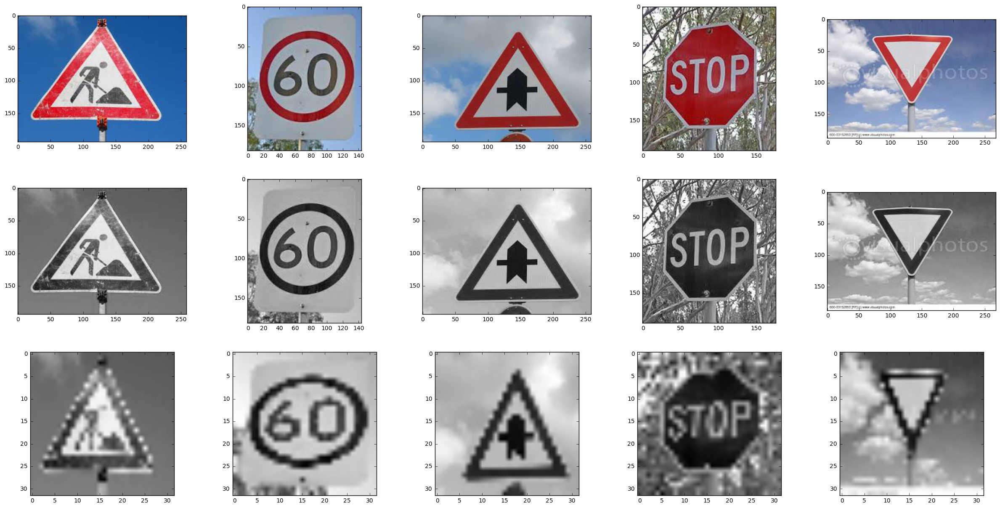

In [7]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.
'''
This code prepares the 5 images to be 
tested with the model. The steps are as follows:
1. Read in the 5 images
2. Convert to grayscale
3. Resize to 32x32x1
4. Visualize each step
'''

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline
from sklearn.preprocessing import LabelBinarizer

def image_resize(img, img_cols, img_rows):
    return cv2.resize(img, (img_cols, img_rows), interpolation = cv2.INTER_LINEAR)

image1 = mpimg.imread('test_images/roadwork.jpg')
#printing out some stats and plotting
print('This image is:', type(image1), 'with dimesions:', image1.shape)
image2 = mpimg.imread('test_images/60kph.jpg')
#printing out some stats and plotting
print('This image is:', type(image2), 'with dimesions:', image2.shape)
image3 = mpimg.imread('test_images/rightofway.jpg')
#printing out some stats and plotting
print('This image is:', type(image3), 'with dimesions:', image3.shape)
image4 = mpimg.imread('test_images/stop.jpg')
#printing out some stats and plotting
print('This image is:', type(image4), 'with dimesions:', image4.shape)
image5 = mpimg.imread('test_images/yield.jpg')
#printing out some stats and plotting
print('This image is:', type(image5), 'with dimesions:', image5.shape)

for j in range(1,16):
    plt.subplot(3,5,j)
    if j == 1:
        plt.imshow(image1)#,cmap='gray')
    if j == 2:
        plt.imshow(image2)#,cmap='gray')
    if j == 3:
        plt.imshow(image3)#,cmap='gray')
    if j == 4:
        plt.imshow(image4)#,cmap='gray')
    if j == 5:
        plt.imshow(image5)#,cmap='gray')
    if j == 6:
        plt.imshow(image_gray(image1),cmap='gray')
    if j == 7:
        plt.imshow(image_gray(image2),cmap='gray')
    if j == 8:
        plt.imshow(image_gray(image3),cmap='gray')
    if j == 9:
        plt.imshow(image_gray(image4),cmap='gray')
    if j == 10:
        plt.imshow(image_gray(image5),cmap='gray')
    if j == 11:
        plt.imshow(image_resize(image_gray(image1),32,32),cmap='gray')
    if j == 12:
        plt.imshow(image_resize(image_gray(image2),32,32),cmap='gray')
    if j == 13:
        plt.imshow(image_resize(image_gray(image3),32,32),cmap='gray')
    if j == 14:
        plt.imshow(image_resize(image_gray(image4),32,32),cmap='gray')
    if j == 15:
        plt.imshow(image_resize(image_gray(image5),32,32),cmap='gray')


fig = plt.gcf()
fig.set_size_inches(30, 15)
plt.show()

# Save images into numpy array
new_test = np.zeros((5,32,32))
for i in range(5):
    if i == 0:
        new_test[i,:,:] = image_resize(image_gray(image1),32,32)
    if i == 1:
        new_test[i,:,:] = image_resize(image_gray(image2),32,32)
    if i == 2:
        new_test[i,:,:] = image_resize(image_gray(image3),32,32)
    if i == 3:
        new_test[i,:,:] = image_resize(image_gray(image4),32,32)
    if i == 4:
        new_test[i,:,:] = image_resize(image_gray(image5),32,32)

X_new_test = np.zeros((5,32,32,1))
X_new_test[:,:,:,0] = (new_test-128)/128
y_test_new = [25,3,11,14,13]
onehot = LabelBinarizer()
onehot.fit(y_train_gray)
y_test_new = onehot.transform(y_test_new)
y_test_new = y_test_new.astype(np.float32)  

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**
As shown above, the five images are from 5 different classes. I tried to choose some that were relatively straight forward and others that were a little more difficult. I think the hardest to predict is the "Yield" sign due to the large amount of sky/background in the image. The stop sign and 60kph sign also are somewhat slanted/at an angle.

Test loss on traffic sign data = 0.110
Test accuracy on traffic sign data = 0.974
Test loss on new images = 0.637
Test accuracy on new images = 0.800
Correct Classes:
[ 25.   3.  11.  14.  13.]
Predicted Classes:
[ 25.   3.  11.  14.  18.]
[[25 30 29 24 21]
 [ 3  5  2  9  1]
 [11 30 21 20 27]
 [14 13 34 33 38]
 [18 11 20 13 19]]
[[  9.52968478e-01   4.66012843e-02   2.80305132e-04   1.42518926e-04
    3.36597486e-06]
 [  9.84027505e-01   1.25430170e-02   3.13266367e-03   1.17945303e-04
    5.55557272e-05]
 [  9.99988437e-01   1.13996748e-05   1.04665276e-07   1.16872886e-10
    7.11234110e-12]
 [  9.99997377e-01   1.43004115e-06   1.08691927e-06   6.94865463e-08
    3.23212106e-08]
 [  3.72506768e-01   3.23682845e-01   1.30447626e-01   4.41054404e-02
    3.64217944e-02]]


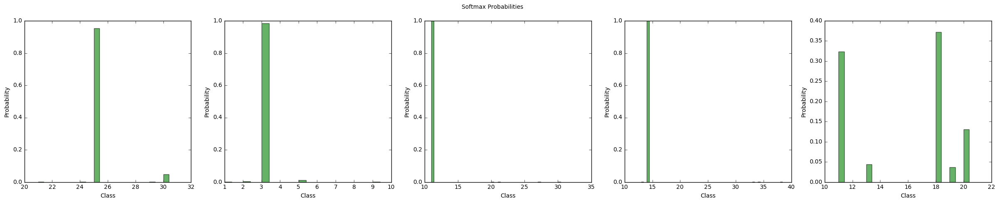

In [9]:
### Run the predictions here.
### Feel free to use as many code cells as needed.
def eval_data_test2(x_set,y_set):
    """
    Given a dataset as input returns the loss and accuracy.
    """
    steps_per_epoch = 1
    num_examples = 5
    total_acc, total_loss = 0, 0
    sess = tf.get_default_session()
    for step in range(steps_per_epoch):
        batch_x = x_set[0:5,:,:,:]
        batch_y = y_set[0:5]
        loss, acc = sess.run([loss_op, accuracy_op], feed_dict={x: batch_x, y: batch_y, keep_prob:1.0, keep_prob1:1.0})
        total_acc += (acc * batch_x.shape[0])
        total_loss += (loss * batch_x.shape[0])
    
    predict = np.ndarray([])
    pred_test = np.zeros((1,5))
    for step in range(steps_per_epoch):
        batch_x = x_set[0:5,:,:,:]
        batch_y = y_set[0:5]
        predict = np.append(predict,sess.run([predictions], feed_dict={x: batch_x, y: batch_y, keep_prob:1.0, keep_prob1:1.0}))
    pred_test[0,:] = predict[1:6]
    pred_test = np.transpose(pred_test)
    return total_loss/num_examples, total_acc/num_examples,pred_test[:,0]

#saver = tf.train.Saver()

with tf.Session() as sess:
    #saver.restore(sess, save_file)
    # Init variables
    sess.run(tf.global_variables_initializer())
           
    # Restore the saved weights
    new_saver = tf.train.import_meta_graph('train_model_10.ckpt.meta')
    new_saver.restore(sess, tf.train.latest_checkpoint('./'))

    # Evaluate on the old test data to check
    test_loss, test_acc = eval_data_test(X_testing,y_testing)
    print("Test loss on traffic sign data = {:.3f}".format(test_loss))
    print("Test accuracy on traffic sign data = {:.3f}".format(test_acc))
    
    # Evaluate on the new test data
    test_loss, test_acc, predict_new = eval_data_test2(X_new_test,y_test_new)
    print("Test loss on new images = {:.3f}".format(test_loss))
    print("Test accuracy on new images = {:.3f}".format(test_acc))  
    print("Correct Classes:")
    print(onehot.inverse_transform(y_test_new))
    print("Predicted Classes:")
    print(predict_new)
    
    # Determine and print out softmax top 5
    predict_soft = tf.nn.softmax(fc2)
    softmax_output = sess.run(predict_soft, feed_dict={x: X_new_test, keep_prob: 1.0, keep_prob1: 1.0})  
    predict_Top5 = tf.nn.top_k(softmax_output, k=5)
    Top5_output = sess.run(predict_Top5)
    print(Top5_output.indices)
    print(Top5_output.values)
    
    # Plot the results for each image
    bar_width = 0.4
    opacity = 0.6
    top_classes = Top5_output.indices
    top_probs = Top5_output.values
    
    plt.suptitle('Softmax Probabilities')
    plt.subplot(1,5,1)
    plt.bar(top_classes[0], top_probs[0], bar_width, alpha=opacity,color='g')
    plt.xlabel('Class')
    plt.ylabel('Probability')
    plt.subplot(1,5,2)
    plt.bar(top_classes[1], top_probs[1], bar_width, alpha=opacity,color='g')
    plt.xlabel('Class')
    plt.ylabel('Probability')
    plt.subplot(1,5,3)
    plt.bar(top_classes[2], top_probs[2], bar_width, alpha=opacity,color='g')
    plt.xlabel('Class')
    plt.ylabel('Probability')
    plt.subplot(1,5,4)
    plt.bar(top_classes[3], top_probs[3], bar_width, alpha=opacity,color='g')
    plt.xlabel('Class')
    plt.ylabel('Probability')
    plt.subplot(1,5,5)
    plt.bar(top_classes[4], top_probs[4], bar_width, alpha=opacity,color='g')
    plt.xlabel('Class')
    plt.ylabel('Probability')
    
    fig = plt.gcf()
    fig.set_size_inches(30, 5)
    plt.show()

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:**

When I tested my first baseline model that only achieved 95.4% accuracy on the test set, the model was not able to perform nearly as well on the 5 images selected from the internet ((3/5) 60% accuracy versus 95.4% accuracy for the traffic sign test data). For my final model with layer skipping the results on these internet images improved. The model was able to correctly predict the classes for all except one example (4/5  80% accuracy on internet images versus 97.5% accuracy for the traffic sign test data). 

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

**Answer:**
The softmax probabilities for the 5 selected images are shown above. I tried to pick a balance of images that were both easy and difficult. The model was able to correctly predict the classes for all but one image (4/5) 80% accuracy. The model is very confident about the 'roadwork', '60 kph', 'rightaway' and 'stop' signs (over 90% Top 1 probability) and less confident about the 'yield' sign. 

The yield sign was predicted incorrectly and the correct class has the 4th highest probability at only 0.04. This yield sign was difficult because of the large proportion of sky/background in the image. It is likely that if this image had been cropped differently, the model would have been more confident in the prediction. Overall it appears that the model has generalized fairly well to these new images.

The following table shows the model's top probability for each image:

| Image # | Sign Type | Top 1 Probability | Outcome |
| ---- | :------------------:| --------:| ---------------:|
| Image 1 | Road Work | 0.95 | Correct |
| Image 2 | 60 kph | 0.98 | Correct | 
| Image 3 | Right of Way | 0.99 | Correct |
| Image 4 | Stop | 0.99 | Correct | 
| Image 5 | Yield | 0.37 | Incorrect |

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.